In [ ]:
%%capture
!pip install keras-tuner
!pip install lime

In [ ]:
import os
import random
import shutil
import pathlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Libraries for Image Processing
import tensorflow as tf
import cv2
import imghdr
import os
import keras_tuner as kt

# from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, matthews_corrcoef, roc_auc_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy
from hyperopt import hp, fmin, tpe
from keras.applications.vgg16 import VGG16
from keras.models import Model
from sklearn.model_selection import GridSearchCV
from keras.models import load_model

# import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
import random

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# **Data Loading and Exploration**

In [ ]:
class_labels = ["Class_0", "Class_1"]
dataset_folder_name = "/content/drive/MyDrive/IS4242 Project/self_collected_Data"
train_path = os.path.join(dataset_folder_name, 'Train')
validation_path = os.path.join(dataset_folder_name, 'Validation')
test_path = os.path.join(dataset_folder_name, 'Test')
random.seed(0)

In [ ]:
data = tf.keras.utils.image_dataset_from_directory(train_path)

In [ ]:
# Checking for unsupported images
import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path(train_path).rglob("*.png")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)

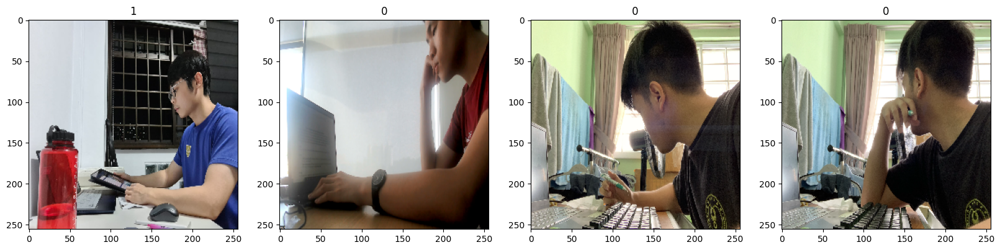

In [ ]:
# Show random data sample where Class 0 is not suspicious and Class 1 is suspicious
data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

[Text(0, 3, '388'), Text(0, 3, '366')]

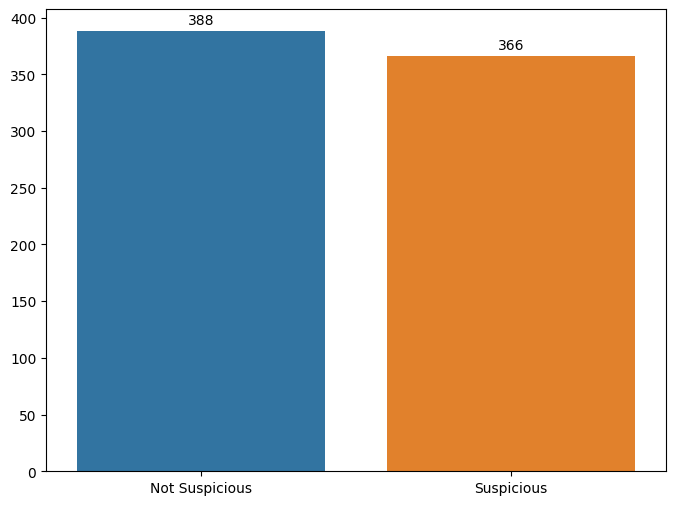

In [ ]:
# show data distribution in both classes - seems relatively even
classes = {'Class_0': "Not Suspicious", 'Class_1':"Suspicious"}
train_number = []
class_num = []
folders = os.listdir(train_path)

for folder in folders:
    train_files = os.listdir(train_path + '/' + folder)
    train_number.append(len(train_files))
    class_num.append(classes[folder])

fig, ax = plt.subplots(figsize=(8, 6))
barchart = sns.barplot(x=class_num, y=train_number, ax=ax)
barchart.bar_label(ax.containers[0], label_type='edge', padding=3)

[Text(0, 3, '147'),
 Text(0, 3, '94'),
 Text(0, 3, '21'),
 Text(0, 3, '41'),
 Text(0, 3, '63')]

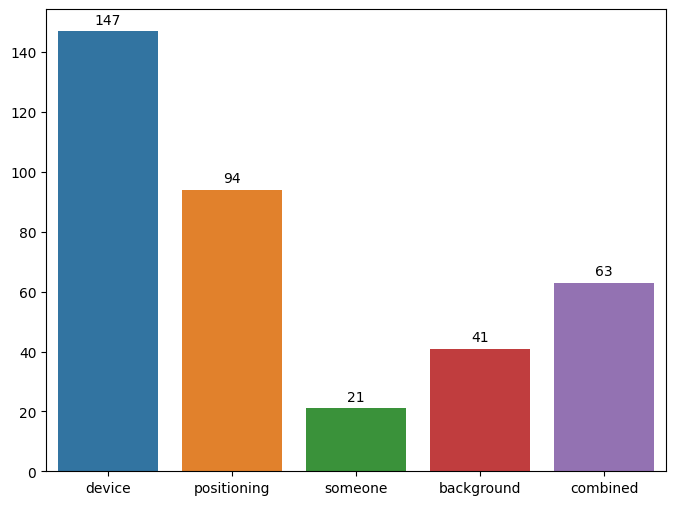

In [ ]:
class_1_folders = os.listdir(train_path + '/Class_1')

sub_category = {"device":0 , "positioning":0, "someone":0, "background":0, "combined":0}
for file in class_1_folders:
  file_name = file.replace(".png", "")
  sub_str= file_name[-2:]
  if sub_str == "00":
    sub_category["device"] += 1
  elif sub_str == "01":
    sub_category["positioning"] += 1
  elif sub_str == "02":
    sub_category["someone"] += 1
  elif sub_str == "03":
    sub_category["background"] += 1
  else:
    sub_category["combined"] += 1

names = list(sub_category.keys())
values = list(sub_category.values())
fig, ax = plt.subplots(figsize=(8, 6))
barchart = sns.barplot(x=names, y=values, ax=ax)
barchart.bar_label(ax.containers[0], label_type='edge', padding=3)

 ### Data Augmentation to Deploy

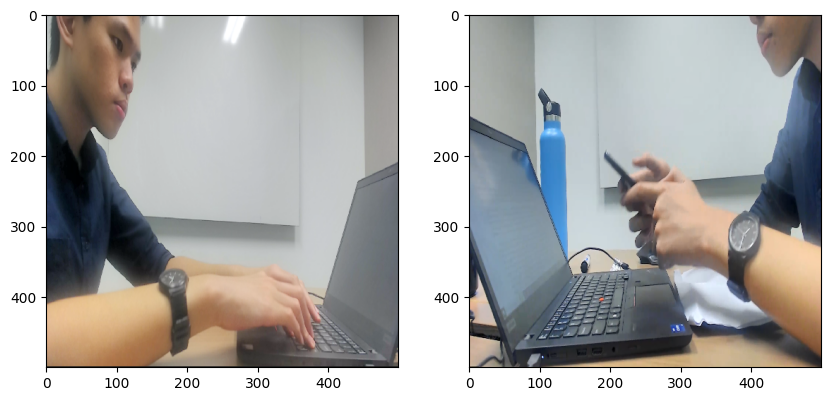

In [ ]:
# show samples of original image from two classes
images = ['/Class_0/00_0001.png', '/Class_1/01_0001_00.png']

plt.figure(figsize=(10,8))
for index, image_relative_path in enumerate(images):
  image_path = train_path + image_relative_path
  img = load_img(image_path, target_size= (500,500))
  img_tensor = img_to_array(img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  # Rescaling values in array for proper visualisation of images
  img_tensor /= 255.
  # Plot a sample image from both classes
  plt.subplot(1, 2, index+1)
  plt.imshow(img_tensor[0])
plt.show()

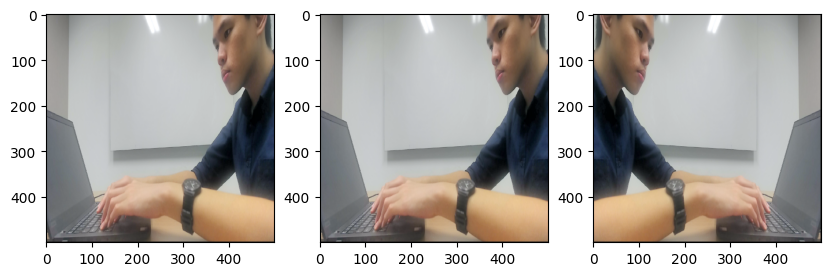

In [ ]:
# Uses ImageDataGenerator to perform horizontal flip of the images
image_path = train_path + '/Class_0/00_0001.png'
img = load_img(image_path, target_size= (500,500))
img_tensor = img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

def plot_image(datagen):
  # Creates the batch of one image
  pic = datagen.flow(img_tensor, batch_size =1)
  plt.figure(figsize=(10,8))
  for i in range(1,4):
    plt.subplot(1, 3, i)
    batch = pic.next()
    image_ = batch[0].astype('uint8')
    plt.imshow(image_)
  plt.show()

datagen = ImageDataGenerator(horizontal_flip=True)
plot_image(datagen)

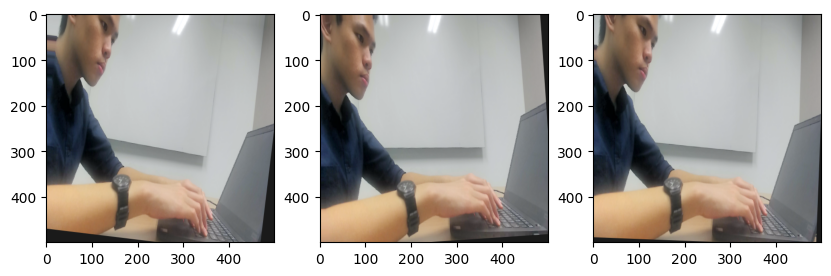

In [ ]:
datagen = ImageDataGenerator(rotation_range=10)
plot_image(datagen)

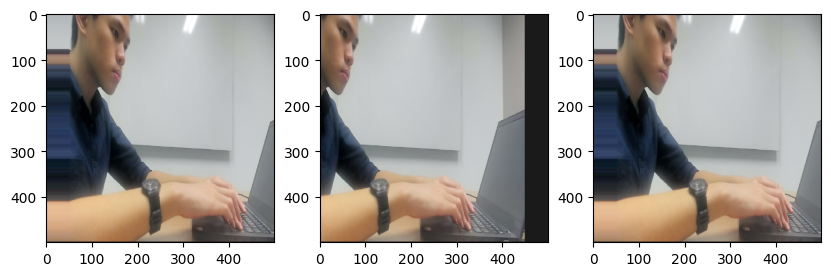

In [ ]:
datagen = ImageDataGenerator(height_shift_range=[0.1, 0.15])
plot_image(datagen)

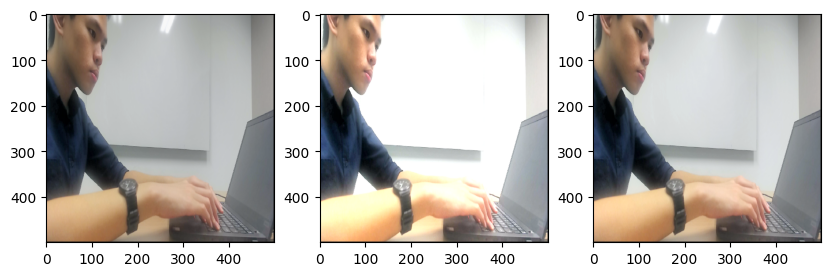

In [ ]:
datagen = ImageDataGenerator(brightness_range=[0.5, 1.5])
plot_image(datagen)

# **Define Common Functions**

### Functions for Image File Movement

In [ ]:
def move_between_folders(source, destination, ratio):
    '''
    This is a helper function to move images from source to destination folder with given ratio.
    '''
    source_files = os.listdir(source)
    if(len(source_files) != 0):
        # get number of files to transfer based on the given ratio then randomly select the index to decide the images to transfer
        num_of_transfer_file = int(len(source_files)*ratio)
        transfer_index = random.sample(range(0, len(source_files)), num_of_transfer_file) # random sampling of images
        for index in transfer_index:
            shutil.move(os.path.join(source, str(source_files[index])), os.path.join(destination, str(source_files[index])))

def move_all_labels_data_between_folders(source, destination, ratio):
    '''
    This is a helper function to move images from source to destination folder for both class labels.
    '''
    for label in class_labels:
        source_path = os.path.join(dataset_folder_name, source, label)
        destination_path = os.path.join(dataset_folder_name, destination, label)
        move_between_folders(source_path, destination_path, ratio)

def prepare_name_with_labels(folder_name, data_type, X, Y):
    '''
    This is a helper function to construct the X which are image files and Y which are class labels 0 and 1.
    '''
    source_files = os.listdir(os.path.join(dataset_folder_name, data_type, folder_name))
    y_label = 0
    for i in range(len(class_labels)):
        if(folder_name == class_labels[i]):
            y_label = i
    for image in source_files:
        X.append(image)
        Y.append(y_label)
    return X, Y

In [ ]:
# Ensure at the initial phase, all images are in Train folder
move_all_labels_data_between_folders('Test', 'Train', 1.0)
move_all_labels_data_between_folders('Validation', 'Train', 1.0)

### Function for Image Augmentation

In [ ]:
def data_augmentation_train_val(img_rows, img_cols, batch_size):
    '''
    This is a function to perform image augmentation for training data and standardisation for all data
    '''
    train_datagen = ImageDataGenerator(
      rescale=1./255, 
      rotation_range=10, 
      height_shift_range=0.1,  
      horizontal_flip=True,
      brightness_range=[0.5, 1.5],
      fill_mode="nearest"
    )
    validation_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        train_path,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode='categorical',
        subset='training',
        shuffle=True,
        seed=4242)

    validation_generator = validation_datagen.flow_from_directory(
        validation_path,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode='categorical',  
        shuffle=False,
        seed=4242)
    return train_generator, validation_generator

def data_augmentation_test(img_rows, img_cols, batch_size):
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        test_path,
        target_size=(img_rows, img_cols),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False,
        seed=4242)
    return test_generator

### Function for Performance Metrics

In [ ]:
def evaluate_results(y_true, y_pred, print_result=True):
    '''
    This is a helper function that we will call to print basic results statistics.
    '''
    # Create confusion matrix of validation data
    perf_metric = dict()
    cm = confusion_matrix(y_true, y_pred)
    TN, FP, FN, TP = cm.ravel()

    # Evaluation Statistics
    perf_metric["Accuracy"] = accuracy_score(y_true, y_pred)
    perf_metric["Recall"] = recall_score(y_true, y_pred)
    perf_metric["Precision"] = precision_score(y_true, y_pred)
    perf_metric["F1"] = f1_score(y_true, y_pred)
    perf_metric["MCC"] = matthews_corrcoef(y_true, y_pred)
    perf_metric["F1_macro"] = f1_score(y_true, y_pred, average = "macro")
    perf_metric["ROC_AUC"] = roc_auc_score(y_true, y_pred)

    if print_result:
      # Print confusion matrix
      print("Confusion Matrix: \n", cm)
      print("TN: %s, FP: %s, FN: %s, TP: %s" %(TN, FP, FN, TP))
      print("\n")
      # Print evluation metrics
      for metric, val in perf_metric.items():
        print("{}: {}".format(metric, val))
      print("\n")
      print("\n")
    return perf_metric

In [ ]:
def result_presentation(perf_metric_list):
  '''
  This is a helper function to combine results of all n folds from cross validation and get average performance metrics.
  '''
  results = []
  metrics = ["Accuracy", "Recall", "Precision", "MCC", "F1", "F1_macro", "ROC_AUC"]
  num_folds = len(perf_metric_list)
  for metric in metrics:
    metric_result = {}
    sum = 0
    metric_result["Metric"] = metric
    for index in range(num_folds):
      value = perf_metric_list[index][metric]
      metric_result["Fold_{}".format(index+1)] = value
      sum += value
    averge = sum/num_folds
    metric_result["Average"] = averge    
    results.append(metric_result)
  results_df = pd.DataFrame.from_dict(results)
  return results_df

### Functions for Cross Validation and Test Result Evaluation

In [ ]:
def cross_validation_model_training(folds_num, img_rows, img_cols, batch_size, epoch, model):
    '''
    This is the function to perform model training with cross validation and evaluate model performance.
    '''
    skf = StratifiedKFold(n_splits=folds_num, shuffle=True)
    skf.get_n_splits(X, Y)
    fold_num = 0
    perf_metric_list = []
    for train_index, val_index in skf.split(X, Y):
        # First make sure all images are in train folder
        move_all_labels_data_between_folders('Validation', 'Train', 1.0)
        fold_num += 1
        print("Results for fold", fold_num)
        X_train, X_val = X[train_index], X[val_index]
        Y_train, Y_val = Y[train_index], Y[val_index]
    
        # Move validation images of this fold from train folder to the validation folder
        for each_index in range(len(X_val)):
            class_label = ''
            for i in range(len(class_labels)):
                if(Y_val[each_index] == i):
                    class_label = class_labels[i]
            # Then copy the validation images to the validation folder
            shutil.move(os.path.join(dataset_folder_name, 'Train', class_label, X_val[each_index]),
                        os.path.join(dataset_folder_name, 'Validation', class_label, X_val[each_index]))

        # Perform image processing such as augmentation and standardisation
        train_generator, validation_generator = data_augmentation_train_val(img_rows, img_cols, batch_size)
        
        # fit model and make prediction
        history = model.fit(train_generator, validation_data=validation_generator, epochs=epoch)
        predictions = model.predict(validation_generator, verbose=1)
        y_pred = np.argmax(predictions, axis=1)
        y_true = validation_generator.classes

        #plot training vs val loss
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('model loss')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()
        
        # evaluate validation performance
        print("***Performance on Validation data***")
        perf_metrics = evaluate_results(y_true, y_pred, print_result=True)
        perf_metric_list.append(perf_metrics)
    move_all_labels_data_between_folders('Validation', 'Train', 1.0)
    return perf_metric_list


In [ ]:
def test_results(img_rows, img_cols, batch_size, model):
    '''
    This is the function to evaluate model performance on the unseen test data.
    '''
    print("Performance on Test Data")
    test_generator = data_augmentation_test(img_rows, img_cols, batch_size)
    predictions = model.predict(test_generator, verbose=1)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes
    perf_metrics = evaluate_results(y_true, y_pred, print_result=True)
    return perf_metrics

# **Models Comparison** 

## Train Test Split

In [ ]:
# Use train test split ratio of 0.2, this test data does not involve in model training and only use in final evaluation of model.
move_all_labels_data_between_folders('Train', 'Test', 0.20)

## **Self-Constructed CNN**

### Bayesian Optimisation - CNN

In [ ]:
class NN_Model(kt.HyperModel):

    def build(self, hp):
        model = Sequential()

        # Tune number of convolution and pooling layers
        for i in range(hp.Int('num_hidden_layer', 2, 3)):
            # Tune the padding and filters 
            hp_padding=hp.Choice('padding_'+ str(i), values=['valid', 'same'])
            hp_filters=hp.Choice('filters_'+ str(i), values=[16, 32, 64])
            if i == 0:
                model.add(Conv2D(hp_filters, (3, 3), padding=hp_padding, activation='relu', input_shape=(img_rows, img_cols, num_of_channels)))  
            else:
                model.add(Conv2D(hp_filters, (3, 3), padding=hp_padding, activation='relu'))
            model.add(MaxPooling2D((2, 2)))
            # Tune the dropout rate
            model.add(Dropout(hp.Choice('dropout_'+ str(i), values=[0.0, 0.1, 0.2])))

        model.add(Flatten())

        # Tune the number of hidden neurons in the dense layer
        hp_units = hp.Int('units', min_value=32, max_value=128, step=32)
        model.add(Dense(hp_units, activation='relu', kernel_initializer='he_uniform'))
        model.add(Dense(2, activation="sigmoid"))

        # Tune the learning rate and type of optimizer
        hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
        hp_optimizer=hp.Choice('Optimizer', values=['Adam', 'SGD'])

        if hp_optimizer == 'Adam':
            hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
        elif hp_optimizer == 'SGD':
            hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
            nesterov=True
            momentum=0.9
        model.compile(optimizer = hp_optimizer, loss='binary_crossentropy', metrics=METRICS)
        return model

    def fit(self, hp, model, epochs, callbacks):
        # Tune the batch size
        batch_size =hp.Int('batch-size', min_value=32, max_value=128, step=32)
        train_generator, validation_generator = data_augmentation_train_val(img_rows, img_cols, batch_size)
        return model.fit(
            train_generator,
            epochs=epochs,
            callbacks=callbacks,
            validation_data=validation_generator
        )

In [ ]:
img_rows, img_cols = 100, 100
epoch_num = 30
num_of_channels = 3

# metrics to use in model training
METRICS = [
      tf.keras.metrics.BinaryAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc'),
      tf.keras.metrics.AUC(name='prc', curve='PR')
]


early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_prc', 
    verbose=1,
    patience=5,
    mode='max',
    restore_best_weights=True)


tuner = kt.tuners.BayesianOptimization(
    NN_Model(),
    seed=4242,
    objective=kt.Objective("val_prc", direction="max"), #'val_loss',
    max_trials=20,
    directory='.',
    project_name='tuning_cnn'
)

In [ ]:
# NOTE: This takes 7 hours to run, may consider to skip the running and results file from tuning has uploaded in our github as well
# Perform the tuning process.
move_all_labels_data_between_folders('Train', 'Validation', 0.20)
tuner.search(epochs=epoch_num, callbacks=[early_stopping])
move_all_labels_data_between_folders('Validation', 'Train', 1.0)

In [ ]:
# Print the results of first best three tuning results
# Skip this line if not running the tuning above, tuned results were 
print(tuner.results_summary(3))

Results summary
Results in ./tuning_cnn
Showing 3 best trials
Objective(name="val_prc", direction="max")

Trial 02 summary
Hyperparameters:
num_hidden_layer: 2
padding_0: valid
filters_0: 32
dropout_0: 0.0
padding_1: valid
filters_1: 16
dropout_1: 0.0
units: 64
learning_rate: 0.01
Optimizer: Adam
padding_2: same
filters_2: 16
dropout_2: 0.0
batch-size: 32
Score: 0.8933029770851135

Trial 11 summary
Hyperparameters:
num_hidden_layer: 2
padding_0: same
filters_0: 64
dropout_0: 0.0
padding_1: valid
filters_1: 32
dropout_1: 0.2
units: 96
learning_rate: 0.01
Optimizer: Adam
padding_2: valid
filters_2: 32
dropout_2: 0.1
batch-size: 32
Score: 0.8915483951568604

Trial 05 summary
Hyperparameters:
num_hidden_layer: 3
padding_0: valid
filters_0: 16
dropout_0: 0.1
padding_1: same
filters_1: 16
dropout_1: 0.0
units: 128
learning_rate: 0.001
Optimizer: Adam
padding_2: valid
filters_2: 64
dropout_2: 0.1
batch-size: 64
Score: 0.8769147396087646
None


In [ ]:
move_all_labels_data_between_folders('Validation', 'Train', 1.0)

### Cross Validation to Evaluate Best CNN Model

In [ ]:
# Use best hyper-parameters obtained from the tuning process above to construct the final model
def fully_connected_cnn(img_rows, img_cols, num_of_channels):
  '''
  This is the function to construct the model architecture.
  '''
  model = Sequential()
  model.add(Conv2D(32, (3, 3), padding="valid", activation='relu', input_shape=(img_rows, img_cols, num_of_channels)))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(16, (3, 3), padding="valid", activation='relu'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(16, (3, 3), padding="same", activation='relu'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Flatten())
  model.add(Dense(64, activation='relu', kernel_initializer='he_uniform'))
  model.add(Dense(2, activation="softmax"))
  opt = tf.keras.optimizers.Adam(learning_rate=0.01)
  model.compile(optimizer = opt, loss='binary_crossentropy', metrics=METRICS)
  return model

model = fully_connected_cnn(img_rows, img_cols, num_of_channels)
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 98, 98, 32)        896       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 49, 49, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 47, 47, 16)        4624      
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 23, 23, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 23, 23, 16)        2320      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 11, 11, 16)      

Results for fold 1
Found 401 images belonging to 2 classes.
Found 199 images belonging to 2 classes.
Epoch 1/30
13/13 [==============================] - 46s 3s/step - loss: 0.8600 - accuracy: 0.5062 - precision: 0.5062 - recall: 0.5062 - auc: 0.5001 - prc: 0.5017 - val_loss: 0.6930 - val_accuracy: 0.4925 - val_precision: 0.4925 - val_recall: 0.4925 - val_auc: 0.5111 - val_prc: 0.5083
Epoch 2/30
13/13 [==============================] - 44s 4s/step - loss: 0.6941 - accuracy: 0.5312 - precision: 0.5312 - recall: 0.5312 - auc: 0.5334 - prc: 0.5156 - val_loss: 0.6924 - val_accuracy: 0.5176 - val_precision: 0.5176 - val_recall: 0.5176 - val_auc: 0.5301 - val_prc: 0.5304
Epoch 3/30
13/13 [==============================] - 34s 3s/step - loss: 0.6929 - accuracy: 0.5187 - precision: 0.5187 - recall: 0.5187 - auc: 0.5199 - prc: 0.5050 - val_loss: 0.6863 - val_accuracy: 0.5980 - val_precision: 0.5980 - val_recall: 0.5980 - val_auc: 0.7051 - val_prc: 0.7318
Epoch 4/30
13/13 [=======================

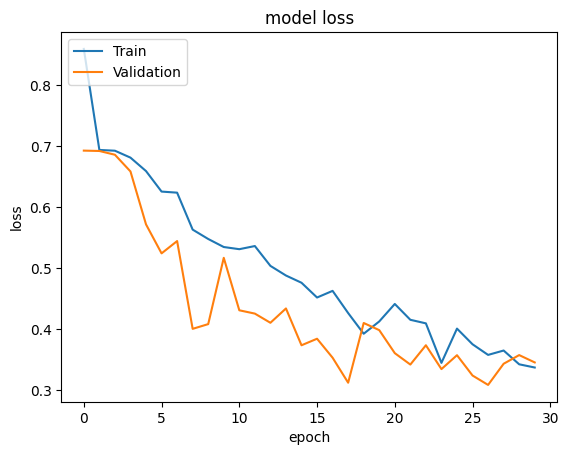

***Performance on Validation data***
Confusion Matrix: 
 [[91 12]
 [17 79]]
TN: 91, FP: 12, FN: 17, TP: 79


Accuracy: 0.8542713567839196
Recall: 0.8229166666666666
Precision: 0.8681318681318682
F1: 0.8449197860962567
MCC: 0.7085648554258788
F1_macro: 0.853739513901209
ROC_AUC: 0.8532059061488673




Results for fold 2
Found 406 images belonging to 2 classes.
Found 198 images belonging to 2 classes.
Epoch 1/30
13/13 [==============================] - 36s 3s/step - loss: 0.3503 - accuracy: 0.8227 - precision: 0.8227 - recall: 0.8227 - auc: 0.9210 - prc: 0.9218 - val_loss: 0.1794 - val_accuracy: 0.9343 - val_precision: 0.9343 - val_recall: 0.9343 - val_auc: 0.9841 - val_prc: 0.9847
Epoch 2/30
13/13 [==============================] - 35s 3s/step - loss: 0.3455 - accuracy: 0.8424 - precision: 0.8424 - recall: 0.8424 - auc: 0.9261 - prc: 0.9203 - val_loss: 0.2095 - val_accuracy: 0.9040 - val_precision: 0.9040 - val_recall: 0.9040 - val_auc: 0.9795 - val_prc: 0.9805
Epoch 3/30
13/13 [=======

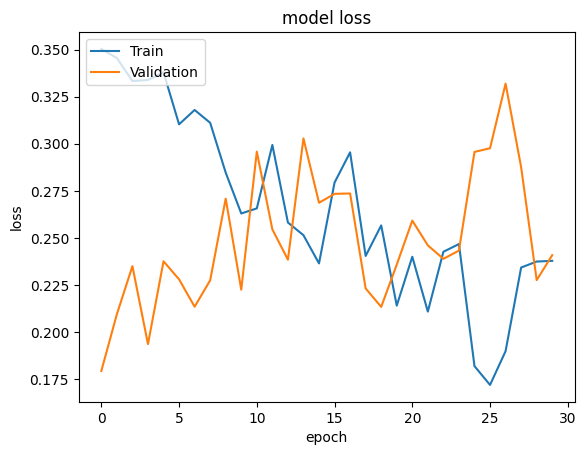

***Performance on Validation data***
Confusion Matrix: 
 [[90 12]
 [11 85]]
TN: 90, FP: 12, FN: 11, TP: 85


Accuracy: 0.8838383838383839
Recall: 0.8854166666666666
Precision: 0.8762886597938144
F1: 0.8808290155440415
MCC: 0.7675736632701473
F1_macro: 0.883764261466602
ROC_AUC: 0.8838848039215685




Results for fold 3
Found 406 images belonging to 2 classes.
Found 198 images belonging to 2 classes.
Epoch 1/30
13/13 [==============================] - 36s 3s/step - loss: 0.2730 - accuracy: 0.8941 - precision: 0.8941 - recall: 0.8941 - auc: 0.9485 - prc: 0.9407 - val_loss: 0.1612 - val_accuracy: 0.9141 - val_precision: 0.9141 - val_recall: 0.9141 - val_auc: 0.9847 - val_prc: 0.9854
Epoch 2/30
13/13 [==============================] - 33s 3s/step - loss: 0.2780 - accuracy: 0.8793 - precision: 0.8793 - recall: 0.8793 - auc: 0.9477 - prc: 0.9415 - val_loss: 0.1610 - val_accuracy: 0.9192 - val_precision: 0.9192 - val_recall: 0.9192 - val_auc: 0.9841 - val_prc: 0.9848
Epoch 3/30
13/13 [=======

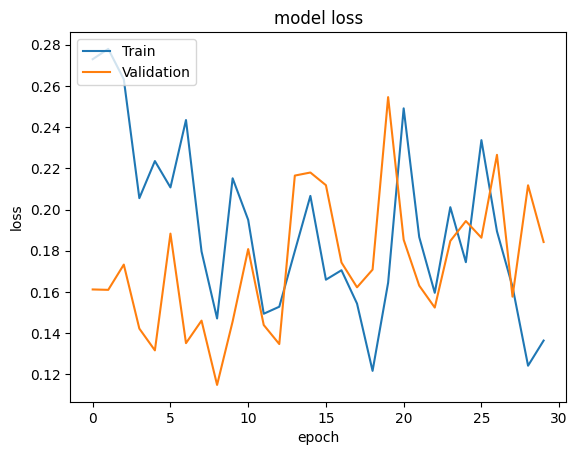

***Performance on Validation data***
Confusion Matrix: 
 [[96  6]
 [ 8 88]]
TN: 96, FP: 6, FN: 8, TP: 88


Accuracy: 0.9292929292929293
Recall: 0.9166666666666666
Precision: 0.9361702127659575
F1: 0.9263157894736843
MCC: 0.8585448495499496
F1_macro: 0.9291773122125704
ROC_AUC: 0.9289215686274509






In [ ]:
folds_num = 3
batch_size = 32
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, batch_size, epoch_num, model)

In [ ]:
# Evaluate model performance during training process with cross validation
result_df = result_presentation(perf_metric_list)
result_df

,Metric,Fold_1,Fold_2,Fold_3,Average
0,Accuracy,0.742574,0.880597,0.910448,0.844540
1,Recall,0.765306,0.855670,0.897959,0.839645
2,Precision,0.721154,0.892473,0.916667,0.843431
3,MCC,0.486460,0.761178,0.820859,0.689499
4,F1,0.742574,0.873684,0.907216,0.841158
5,F1_macro,0.742574,0.880238,0.910339,0.844384
6,ROC_AUC,0.743230,0.879758,0.910145,0.844378


In [ ]:
# Evaluate model performance on test data
perf_result = test_results(img_rows, img_cols, batch_size, model)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 12s 3s/step
Confusion Matrix: 
 [[70  7]
 [12 61]]
TN: 70, FP: 7, FN: 12, TP: 61


Accuracy: 0.8733333333333333
Recall: 0.8356164383561644
Precision: 0.8970588235294118
F1: 0.8652482269503545
MCC: 0.7477063152960162
F1_macro: 0.8728756858022213
ROC_AUC: 0.8723536737235368






In [ ]:
# Save the model
model.save("/content/drive/MyDrive/IS4242 Project/models/model_cnn.hdf5")

##**VGG-16** 

In [ ]:
def fully_connected_vgg(img_rows, img_cols, num_of_channels):
  vgg = VGG16(input_shape=[img_rows, img_cols, num_of_channels], weights='imagenet', include_top=False)
  for layer in vgg.layers:
    layer.trainable = False
  x = Flatten()(vgg.output)
  prediction = Dense(2, activation='softmax')(x)  
  model = Model(inputs=vgg.input, outputs=prediction)
  return model

In [ ]:
folds_num = 3
img_rows, img_cols = 224, 224
batch_size = 64
epoch = 10
num_of_channels = 3
number_of_class_labels = len(class_labels)

model_vgg16 = fully_connected_vgg(img_rows, img_cols, num_of_channels)
model_vgg16.compile(loss='binary_crossentropy',optimizer='adam', metrics=['accuracy'])
model_vgg16.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, batch_size, 20, model_vgg16)

Results for fold 1
Found 402 images belonging to 2 classes.
Found 202 images belonging to 2 classes.
Epoch 1/20
7/7 [==============================] - 42s 4s/step - loss: 0.7777 - accuracy: 0.5672
Epoch 2/20
7/7 [==============================] - 27s 4s/step - loss: 0.5191 - accuracy: 0.7512
Epoch 3/20
7/7 [==============================] - 29s 4s/step - loss: 0.4250 - accuracy: 0.8234
Epoch 4/20
7/7 [==============================] - 27s 4s/step - loss: 0.3574 - accuracy: 0.8632
Epoch 5/20
7/7 [==============================] - 27s 4s/step - loss: 0.3363 - accuracy: 0.8657
Epoch 6/20
7/7 [==============================] - 27s 4s/step - loss: 0.2993 - accuracy: 0.8731
Epoch 7/20
7/7 [==============================] - 28s 4s/step - loss: 0.2773 - accuracy: 0.8980
Epoch 8/20
7/7 [==============================] - 28s 4s/step - loss: 0.2484 - accuracy: 0.9229
Epoch 9/20
7/7 [==============================] - 27s 4s/step - loss: 0.2469 - accuracy: 0.9080
Epoch 10/20
7/7 [==================

In [ ]:
result_df = result_presentation(perf_metric_list)
result_df

,Metric,Fold_1,Fold_2,Fold_3,Average
0,Accuracy,0.851485,0.960199,0.975124,0.928936
1,Recall,0.765306,0.917526,0.959184,0.880672
2,Precision,0.914634,1.000000,0.989474,0.968036
3,MCC,0.710373,0.923032,0.950606,0.861337
4,F1,0.833333,0.956989,0.974093,0.921472
5,F1_macro,0.849702,0.959976,0.975085,0.928254
6,ROC_AUC,0.848999,0.958763,0.974737,0.927500


In [ ]:
perf_result = test_results(img_rows, img_cols, batch_size, model_vgg16)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 12s 4s/step
Confusion Matrix: 
 [[71  6]
 [10 63]]
TN: 71, FP: 6, FN: 10, TP: 63


Accuracy: 0.8933333333333333
Recall: 0.863013698630137
Precision: 0.9130434782608695
F1: 0.8873239436619719
MCC: 0.7873359465179463
F1_macro: 0.8930290604385809
ROC_AUC: 0.8925458103540295






In [ ]:
path = '/content/drive/MyDrive/IS4242 Project/models/model_vgg16.hdf5'
model_vgg16.save(path)

##**VGG19**

In [ ]:
from keras.applications.vgg19 import VGG19

In [ ]:
class MyHyperModel(kt.HyperModel):
    def build(self, hp):

        base_model=VGG19(
          include_top=False,
          weights="imagenet",
          input_shape=[img_rows, img_cols, num_of_channels])

        base_model.trainable = False
        model = Sequential()
        model.add(base_model)
        model.add(Flatten())
        model.add(Dense(2,activation='softmax')) 


        # Tune the learning rate and type of optimizer
        hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
        hp_optimizer=hp.Choice('Optimizer', values=['Adam', 'SGD'])

        if hp_optimizer == 'Adam':
            hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
        elif hp_optimizer == 'SGD':
            hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3])
            nesterov=True
            momentum=0.9
        model.compile(optimizer = hp_optimizer, loss='binary_crossentropy', metrics=["accuracy"])

        return model

    def fit(self, hp, model, epochs, callbacks):
        # Tune the batch size
        batch_size =hp.Int('batch-size', min_value=32, max_value=128, step=32)
        train_generator, validation_generator = data_augmentation_train_val(img_rows, img_cols, batch_size)
        return model.fit(
            train_generator,
            epochs=epochs,
            callbacks=callbacks,
            validation_data=validation_generator
        )



In [ ]:
img_rows, img_cols = 224, 224
epoch_num = 30
num_of_channels = 3

# metrics to use in model training
METRICS = [
      tf.keras.metrics.BinaryAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc'),
]


early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', 
    verbose=1,
    patience=5,
    mode='max',
    restore_best_weights=True)


tuner = kt.tuners.BayesianOptimization(
    MyHyperModel(),
    seed=4242,
    objective=kt.Objective("val_loss", direction="max"), #'val_loss',
    max_trials=10,
    directory='.',
    project_name='tuning_vgg'
)

80134624/80134624 [==============================] - 3s 0us/step


In [ ]:
move_all_labels_data_between_folders('Train', 'Validation', 0.20)
tuner.search(epochs=epoch_num, callbacks=[early_stopping])
move_all_labels_data_between_folders('Validation', 'Train', 1.0)

In [ ]:
print(tuner.results_summary(1))

Results summary
Results in ./tuning_vgg
Showing 1 best trials
Objective(name="val_loss", direction="max")

Trial 00 summary
Hyperparameters:
learning_rate: 0.001
Optimizer: SGD
batch-size: 32
Score: 7.621971130371094
None


In [ ]:
def vgg_19(img_rows, img_cols, num_of_channels):
  vgg_19_model = VGG19(input_shape=[img_rows, img_cols, num_of_channels], weights='imagenet', include_top=False)
  for layer in vgg_19_model.layers:
    layer.trainable = False
  x = Flatten()(vgg_19_model.output)
  prediction = Dense(2, activation='softmax')(x)  
  model = Model(inputs=vgg_19_model.input, outputs=prediction)
  return model

In [ ]:
folds_num = 3
img_rows, img_cols = 224, 224
batch_size = 32
epoch = 10
num_of_channels = 3
number_of_class_labels = len(class_labels)

model_vgg19 = vgg_19(img_rows, img_cols, num_of_channels)
model_vgg19.compile(loss='binary_crossentropy',optimizer="adam", metrics=['accuracy'])
model_vgg19.summary()

80134624/80134624 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
#check that all images are moved back
move_all_labels_data_between_folders('Validation', 'Train', 1.0) 

tf.keras.utils.image_dataset_from_directory(train_path)
tf.keras.utils.image_dataset_from_directory(test_path)

Found 604 files belonging to 2 classes.
Found 150 files belonging to 2 classes.


<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, 64, 30, model_vgg19)

Results for fold 1
Found 402 images belonging to 2 classes.
Found 202 images belonging to 2 classes.
Epoch 1/30
7/7 [==============================] - 146s 17s/step - loss: 0.8325 - accuracy: 0.5423
Epoch 2/30
7/7 [==============================] - 29s 4s/step - loss: 0.5960 - accuracy: 0.7040
Epoch 3/30
7/7 [==============================] - 29s 4s/step - loss: 0.5011 - accuracy: 0.7687
Epoch 4/30
7/7 [==============================] - 29s 4s/step - loss: 0.4321 - accuracy: 0.8383
Epoch 5/30
7/7 [==============================] - 29s 4s/step - loss: 0.3793 - accuracy: 0.8483
Epoch 6/30
7/7 [==============================] - 29s 4s/step - loss: 0.3435 - accuracy: 0.8905
Epoch 7/30
7/7 [==============================] - 29s 5s/step - loss: 0.3301 - accuracy: 0.8682
Epoch 8/30
7/7 [==============================] - 29s 5s/step - loss: 0.3012 - accuracy: 0.9055
Epoch 9/30
7/7 [==============================] - 29s 4s/step - loss: 0.2829 - accuracy: 0.9005
Epoch 10/30
7/7 [================

In [ ]:
result_df = result_presentation(perf_metric_list)
result_df

,Metric,Fold_1,Fold_2,Fold_3,Average
0,Accuracy,0.876238,0.980100,0.955224,0.937187
1,Recall,0.846939,1.000000,0.928571,0.925170
2,Precision,0.892473,0.960396,0.978495,0.943788
3,MCC,0.752819,0.960967,0.911414,0.875067
4,F1,0.869110,0.979798,0.952880,0.933929
5,F1_macro,0.875870,0.980095,0.955113,0.937026
6,ROC_AUC,0.875392,0.980769,0.954577,0.936913


In [ ]:
perf_result = test_results(img_rows, img_cols, batch_size, model_vgg19)

Performance on Test Data
Found 150 images belonging to 2 classes.
5/5 [==============================] - 85s 19s/step
Confusion Matrix: 
 [[74  3]
 [12 61]]
TN: 74, FP: 3, FN: 12, TP: 61


Accuracy: 0.9
Recall: 0.8356164383561644
Precision: 0.953125
F1: 0.8905109489051095
MCC: 0.8050782316199022
F1_macro: 0.8992432045139045
ROC_AUC: 0.8983276996975627






In [ ]:
path = '/content/drive/MyDrive/IS4242 Project/models/model_vgg19.hdf5'
model_vgg19.save(path)

##**VGG19 - Changing number of layers to unfreeze: last 4 layers**

In [ ]:
def vgg_19_trainable(img_rows, img_cols, num_of_channels):
  vgg_19_model = VGG19(input_shape=[img_rows, img_cols, num_of_channels], weights='imagenet', include_top=False)
  for layer in vgg_19_model.layers[:-2]:
    layer.trainable = False
  x = Flatten()(vgg_19_model.output)
  prediction = Dense(2, activation='softmax')(x)  
  model = Model(inputs=vgg_19_model.input, outputs=prediction)
  return model

In [ ]:
model_vgg19_train = vgg_19_trainable(img_rows, img_cols, num_of_channels)
model_vgg19_train.compile(loss='binary_crossentropy',optimizer="adam", metrics=['accuracy'])
model_vgg19_train.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
for layer in model_vgg19_train.layers:
  print(layer.trainable)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
True
True
True


In [ ]:
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, 64, 30, model_vgg19_train)

Results for fold 1
Found 402 images belonging to 2 classes.
Found 202 images belonging to 2 classes.
Epoch 1/30
7/7 [==============================] - 30s 4s/step - loss: 0.9152 - accuracy: 0.6219
Epoch 2/30
7/7 [==============================] - 29s 4s/step - loss: 0.4841 - accuracy: 0.7886
Epoch 3/30
7/7 [==============================] - 28s 4s/step - loss: 0.3916 - accuracy: 0.8383
Epoch 4/30
7/7 [==============================] - 28s 4s/step - loss: 0.3080 - accuracy: 0.8756
Epoch 5/30
7/7 [==============================] - 28s 4s/step - loss: 0.2488 - accuracy: 0.9030
Epoch 6/30
7/7 [==============================] - 29s 4s/step - loss: 0.2246 - accuracy: 0.9080
Epoch 7/30
7/7 [==============================] - 28s 4s/step - loss: 0.1901 - accuracy: 0.9129
Epoch 8/30
7/7 [==============================] - 28s 4s/step - loss: 0.1552 - accuracy: 0.9279
Epoch 9/30
7/7 [==============================] - 28s 4s/step - loss: 0.1512 - accuracy: 0.9403
Epoch 10/30
7/7 [==================

In [ ]:
perf_result = test_results(img_rows, img_cols, 64, model_vgg19_train)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 10s 2s/step
Confusion Matrix: 
 [[72  5]
 [ 7 66]]
TN: 72, FP: 5, FN: 7, TP: 66


Accuracy: 0.92
Recall: 0.9041095890410958
Precision: 0.9295774647887324
F1: 0.9166666666666666
MCC: 0.8400717173673821
F1_macro: 0.9198717948717948
ROC_AUC: 0.9195872620530154






##**VGG19 - Changing number of layers to unfreeze: last 5 layers**

In [ ]:
def vgg_19_trainable1(img_rows, img_cols, num_of_channels):
  vgg_19_model = VGG19(input_shape=[img_rows, img_cols, num_of_channels], weights='imagenet', include_top=False)
  for layer in vgg_19_model.layers[:-3]:
    layer.trainable = False
  x = Flatten()(vgg_19_model.output)
  prediction = Dense(2, activation='softmax')(x)  
  model = Model(inputs=vgg_19_model.input, outputs=prediction)
  return model

In [ ]:
model_vgg19_train1 = vgg_19_trainable1(img_rows, img_cols, num_of_channels)
model_vgg19_train1.compile(loss='binary_crossentropy',optimizer="adam", metrics=['accuracy'])
model_vgg19_train1.summary()

80134624/80134624 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 100, 100, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 100, 100, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 50, 50, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 50, 50, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 50, 50, 128)       147584    
                                                              

In [ ]:
for layer in model_vgg19_train1.layers:
  print(layer.trainable)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
True
True
True
True


Results for fold 1
Found 402 images belonging to 2 classes.
Found 202 images belonging to 2 classes.
Epoch 1/30
7/7 [==============================] - 46s 6s/step - loss: 1.0455 - accuracy: 0.4925 - val_loss: 0.6855 - val_accuracy: 0.5149
Epoch 2/30
7/7 [==============================] - 34s 5s/step - loss: 0.6734 - accuracy: 0.5821 - val_loss: 0.6139 - val_accuracy: 0.6931
Epoch 3/30
7/7 [==============================] - 45s 7s/step - loss: 0.6218 - accuracy: 0.6542 - val_loss: 0.5736 - val_accuracy: 0.6931
Epoch 4/30
7/7 [==============================] - 35s 5s/step - loss: 0.5653 - accuracy: 0.7090 - val_loss: 0.4853 - val_accuracy: 0.7921
Epoch 5/30
7/7 [==============================] - 35s 6s/step - loss: 0.5610 - accuracy: 0.6940 - val_loss: 0.4960 - val_accuracy: 0.7871
Epoch 6/30
7/7 [==============================] - 35s 5s/step - loss: 0.4761 - accuracy: 0.8159 - val_loss: 0.4253 - val_accuracy: 0.8416
Epoch 7/30
7/7 [==============================] - 35s 5s/step - loss: 0

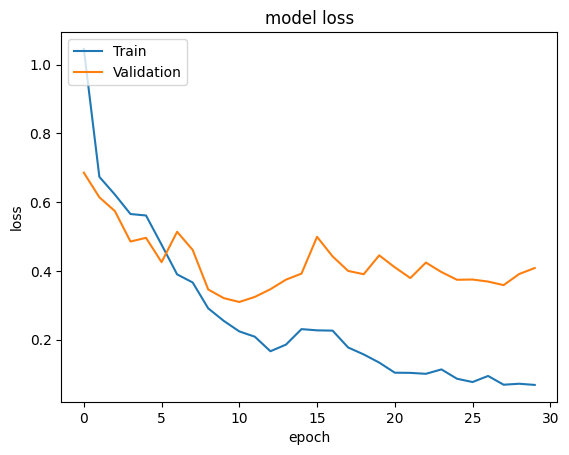

***Performance on Validation data***
Confusion Matrix: 
 [[89 15]
 [ 9 89]]
TN: 89, FP: 15, FN: 9, TP: 89


Accuracy: 0.8811881188118812
Recall: 0.9081632653061225
Precision: 0.8557692307692307
F1: 0.8811881188118811
MCC: 0.7639324960753532
F1_macro: 0.8811881188118811
ROC_AUC: 0.8819662480376768




Results for fold 2
Found 403 images belonging to 2 classes.
Found 201 images belonging to 2 classes.
Epoch 1/30
7/7 [==============================] - 41s 6s/step - loss: 0.2373 - accuracy: 0.9231 - val_loss: 0.0559 - val_accuracy: 0.9801
Epoch 2/30
7/7 [==============================] - 34s 5s/step - loss: 0.3068 - accuracy: 0.8958 - val_loss: 0.0429 - val_accuracy: 0.9851
Epoch 3/30
7/7 [==============================] - 36s 5s/step - loss: 0.2338 - accuracy: 0.9032 - val_loss: 0.1145 - val_accuracy: 0.9701
Epoch 4/30
7/7 [==============================] - 34s 5s/step - loss: 0.2187 - accuracy: 0.9082 - val_loss: 0.1117 - val_accuracy: 0.9552
Epoch 5/30
7/7 [=============================

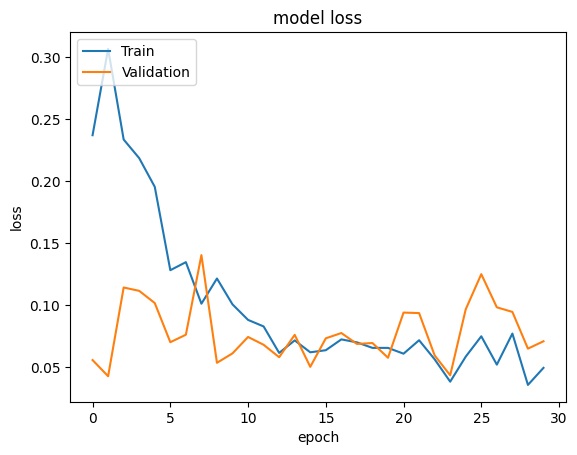

***Performance on Validation data***
Confusion Matrix: 
 [[101   3]
 [  2  95]]
TN: 101, FP: 3, FN: 2, TP: 95


Accuracy: 0.9751243781094527
Recall: 0.979381443298969
Precision: 0.9693877551020408
F1: 0.9743589743589743
MCC: 0.9502527424197353
F1_macro: 0.9751021924934968
ROC_AUC: 0.9752676447264076




Results for fold 3
Found 403 images belonging to 2 classes.
Found 201 images belonging to 2 classes.
Epoch 1/30
7/7 [==============================] - 40s 7s/step - loss: 0.1348 - accuracy: 0.9504 - val_loss: 0.0451 - val_accuracy: 0.9701
Epoch 2/30
7/7 [==============================] - 36s 5s/step - loss: 0.1053 - accuracy: 0.9628 - val_loss: 0.0303 - val_accuracy: 0.9900
Epoch 3/30
7/7 [==============================] - 34s 5s/step - loss: 0.0575 - accuracy: 0.9777 - val_loss: 0.0292 - val_accuracy: 0.9950
Epoch 4/30
7/7 [==============================] - 36s 6s/step - loss: 0.0512 - accuracy: 0.9777 - val_loss: 0.0887 - val_accuracy: 0.9602
Epoch 5/30
7/7 [==========================

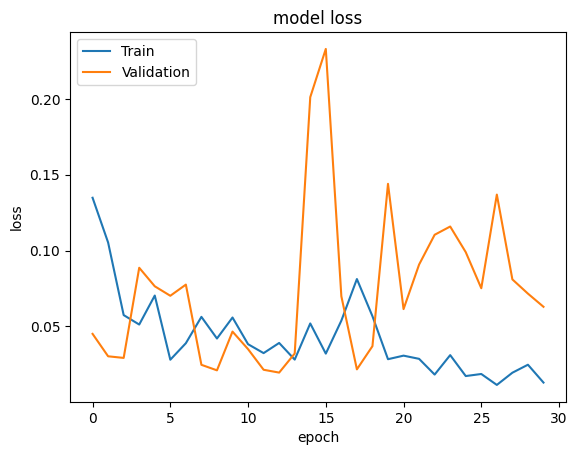

***Performance on Validation data***
Confusion Matrix: 
 [[101   2]
 [  2  96]]
TN: 101, FP: 2, FN: 2, TP: 96


Accuracy: 0.9800995024875622
Recall: 0.9795918367346939
Precision: 0.9795918367346939
F1: 0.9795918367346939
MCC: 0.9601743610065385
F1_macro: 0.9800871805032693
ROC_AUC: 0.9800871805032693






In [ ]:
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, 64, 30, model_vgg19_train1)

In [ ]:
perf_result = test_results(img_rows, img_cols, 64, model_vgg19_train1)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 9s 2s/step
Confusion Matrix: 
 [[70  7]
 [ 6 67]]
TN: 70, FP: 7, FN: 6, TP: 67


Accuracy: 0.9133333333333333
Recall: 0.9178082191780822
Precision: 0.9054054054054054
F1: 0.9115646258503401
MCC: 0.8266785532075106
F1_macro: 0.9132986527944511
ROC_AUC: 0.9134495641344957






In [ ]:
path = '/content/drive/MyDrive/IS4242 Project/models/model_vgg19_train.hdf5'
model_vgg19_train.save(path)

In [ ]:
path = '/content/drive/MyDrive/IS4242 Project/models/model_vgg19_train1.hdf5'
model_vgg19_train1.save(path)

##**INCEPTIONV3**

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

In [ ]:
def inception_v3(img_rows, img_cols, num_of_channels):
  incep_v3 = InceptionV3(input_shape=[img_rows, img_cols, num_of_channels], weights='imagenet', include_top=False)
  for layer in incep_v3.layers:
    layer.trainable = False
  x = Flatten()(incep_v3.output)
  prediction = Dense(2, activation='softmax')(x)  
  model = Model(inputs=incep_v3.input, outputs=prediction)
  
  return model

In [ ]:
folds_num = 3
img_rows, img_cols = 224, 224
batch_size = 64
epoch = 10
num_of_channels = 3
number_of_class_labels = len(class_labels)

model_inceptionv3 = inception_v3(img_rows, img_cols, num_of_channels)
model_inceptionv3.compile(loss='binary_crossentropy',optimizer='adam', metrics=['accuracy'])
model_inceptionv3.summary()

87910968/87910968 [==============================] - 2s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                

In [ ]:
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, batch_size, 20, model_inceptionv3)

Results for fold 1
Found 402 images belonging to 2 classes.
Found 202 images belonging to 2 classes.
Epoch 1/20
7/7 [==============================] - 34s 4s/step - loss: 3.5985 - accuracy: 0.5522
Epoch 2/20
7/7 [==============================] - 27s 4s/step - loss: 1.4502 - accuracy: 0.7214
Epoch 3/20
7/7 [==============================] - 27s 4s/step - loss: 1.0700 - accuracy: 0.8159
Epoch 4/20
7/7 [==============================] - 27s 4s/step - loss: 0.7097 - accuracy: 0.8433
Epoch 5/20
7/7 [==============================] - 27s 4s/step - loss: 0.7361 - accuracy: 0.8383
Epoch 6/20
7/7 [==============================] - 27s 4s/step - loss: 0.5775 - accuracy: 0.8582
Epoch 7/20
7/7 [==============================] - 27s 4s/step - loss: 0.4087 - accuracy: 0.8955
Epoch 8/20
7/7 [==============================] - 27s 4s/step - loss: 0.5061 - accuracy: 0.8781
Epoch 9/20
7/7 [==============================] - 27s 4s/step - loss: 0.6064 - accuracy: 0.8483
Epoch 10/20
7/7 [==================

In [ ]:
result_df = result_presentation(perf_metric_list)
result_df

,Metric,Fold_1,Fold_2,Fold_3,Average
0,Accuracy,0.861386,0.950249,0.950249,0.920628
1,Recall,0.867347,0.979381,0.948980,0.931903
2,Precision,0.850000,0.922330,0.948980,0.907103
3,MCC,0.722833,0.902190,0.900436,0.841820
4,F1,0.858586,0.950000,0.948980,0.919188
5,F1_macro,0.861332,0.950248,0.950218,0.920599
6,ROC_AUC,0.861558,0.951229,0.950218,0.921002


In [ ]:
perf_result = test_results(img_rows, img_cols, batch_size, model_inceptionv3)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 12s 3s/step
Confusion Matrix: 
 [[70  7]
 [12 61]]
TN: 70, FP: 7, FN: 12, TP: 61


Accuracy: 0.8733333333333333
Recall: 0.8356164383561644
Precision: 0.8970588235294118
F1: 0.8652482269503545
MCC: 0.7477063152960162
F1_macro: 0.8728756858022213
ROC_AUC: 0.8723536737235368






In [ ]:
path = '/content/drive/MyDrive/IS4242 Project/models/model_incepv3.hdf5'
model_inceptionv3.save(path)

##**RESNET50**

In [ ]:
from tensorflow.keras.applications import ResNet50

In [ ]:
def rn50(img_rows, img_cols, num_of_channels):
  rn_50 = ResNet50(input_shape=[img_rows, img_cols, num_of_channels], weights='imagenet', include_top=False)
  for layer in rn_50.layers:
    layer.trainable = False
  x = Flatten()(rn_50.output)
  prediction = Dense(2, activation='softmax')(x)  
  model = Model(inputs=rn_50.input, outputs=prediction)
  
  return model

In [ ]:
folds_num = 3
img_rows, img_cols = 224, 224
batch_size = 64
epoch = 10
num_of_channels = 3
number_of_class_labels = len(class_labels)

model_rn50 = rn50(img_rows, img_cols, num_of_channels)
model_rn50.compile(loss='binary_crossentropy',optimizer='adam', metrics=['accuracy'])
model_rn50.summary()

94765736/94765736 [==============================] - 5s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                           

In [ ]:
# Organize file names and class labels in X and Y variables
X, Y = [], []
for i in range(len(class_labels)):
    X, Y = prepare_name_with_labels(class_labels[i], "Train", X, Y)
X = np.asarray(X)
Y = np.asarray(Y)

perf_metric_list = cross_validation_model_training(folds_num, img_rows, img_cols, batch_size, 30, model_rn50)

Results for fold 1
Found 402 images belonging to 2 classes.
Found 202 images belonging to 2 classes.
Epoch 1/30
7/7 [==============================] - 31s 3s/step - loss: 2.6003 - accuracy: 0.4950
Epoch 2/30
7/7 [==============================] - 27s 4s/step - loss: 1.5729 - accuracy: 0.5075
Epoch 3/30
7/7 [==============================] - 28s 4s/step - loss: 1.1686 - accuracy: 0.5050
Epoch 4/30
7/7 [==============================] - 27s 4s/step - loss: 1.0744 - accuracy: 0.4701
Epoch 5/30
7/7 [==============================] - 27s 4s/step - loss: 0.8345 - accuracy: 0.5149
Epoch 6/30
7/7 [==============================] - 27s 4s/step - loss: 0.8912 - accuracy: 0.5498
Epoch 7/30
7/7 [==============================] - 27s 4s/step - loss: 0.7166 - accuracy: 0.5572
Epoch 8/30
7/7 [==============================] - 27s 4s/step - loss: 0.7054 - accuracy: 0.6095
Epoch 9/30
7/7 [==============================] - 27s 4s/step - loss: 0.6872 - accuracy: 0.5896
Epoch 10/30
7/7 [==================

In [ ]:
result_df = result_presentation(perf_metric_list)
result_df

,Metric,Fold_1,Fold_2,Fold_3,Average
0,Accuracy,0.603960,0.701493,0.746269,0.683907
1,Recall,0.255102,0.659794,0.571429,0.495441
2,Precision,0.781250,0.703297,0.861538,0.782028
3,MCC,0.257047,0.401735,0.517244,0.392009
4,F1,0.384615,0.680851,0.687117,0.584194
5,F1_macro,0.546322,0.700239,0.736864,0.661142
6,ROC_AUC,0.593897,0.700089,0.742025,0.678670


In [ ]:
perf_result = test_results(img_rows, img_cols, batch_size, model_rn50)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 10s 2s/step
Confusion Matrix: 
 [[72  5]
 [39 34]]
TN: 72, FP: 5, FN: 39, TP: 34


Accuracy: 0.7066666666666667
Recall: 0.4657534246575342
Precision: 0.8717948717948718
F1: 0.6071428571428571
MCC: 0.4567311224258309
F1_macro: 0.6865501519756838
ROC_AUC: 0.7004091798612347






In [ ]:
path = '/content/drive/MyDrive/IS4242 Project/models/model_rn50.hdf5'
model_rn50.save(path)

## **LIME - Model Explanability**
Identify what are the features the model extract to use for prediction

## CNN

In [ ]:
img_rows, img_cols = 100, 100
batch_size = 64
epoch_num = 30
model = load_model('/content/drive/MyDrive/IS4242 Project/models/model_cnn.hdf5')

test_generator = data_augmentation_test(100, 100, 64)
predictions = model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# train_generator, validation_generator = data_augmentation_train_val(img_rows, img_cols, batch_size)
# predictions = model_vgg19_train1.predict(train_generator, verbose = 1)
# y_pred = np.argmax(predictions, axis=1)
# y_true = train_generator.classes
# indices = np.where(y_true == y_pred)[0]

TN_indices = np.where((y_true == 0) & (y_pred == 0))
TP_indices = np.where((y_true == 1) & (y_pred == 1))

# print("Indices where elements are the same:", indices)
# print("Values at those indices in a:", y_pred[indices])
# print("Values at those indices in b:", y_true[indices])

Found 150 images belonging to 2 classes.
3/3 [==============================] - 18s 7s/step


### True Negatives

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


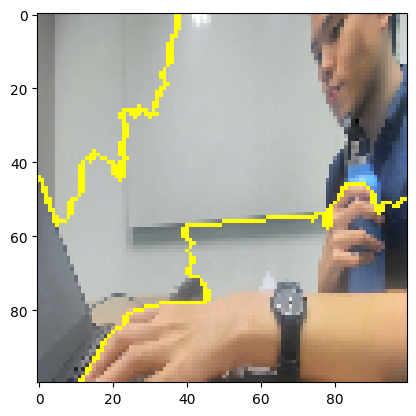

In [ ]:
idx = TN_indices[0][1]
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


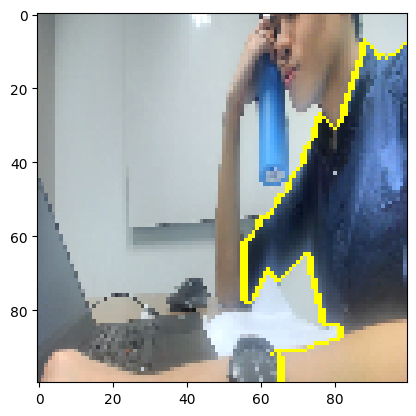

In [ ]:
idx = TN_indices[0][0]
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


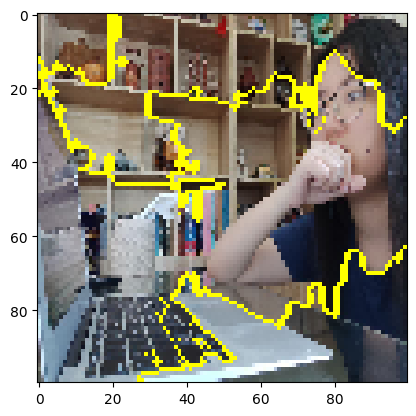

In [ ]:
idx = TN_indices[0][2]
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


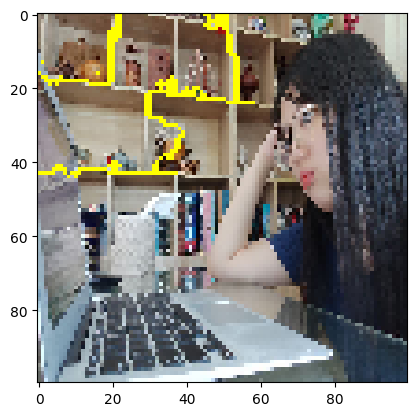

In [ ]:
idx = TN_indices[0][3]
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


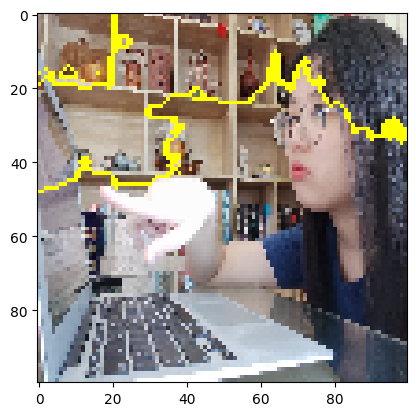

In [ ]:
idx = TN_indices[0][4]
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

### True Positives

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


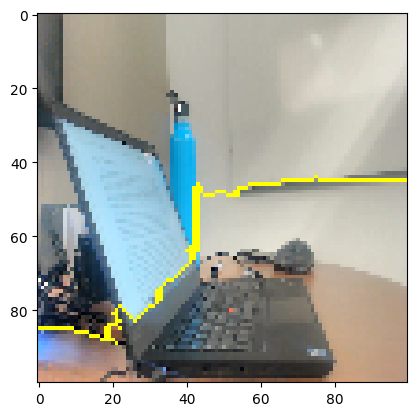

In [ ]:
idx = TP_indices[0][0] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


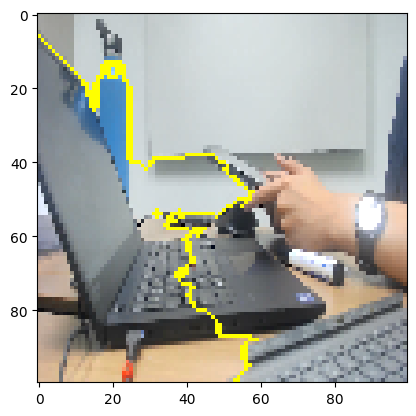

In [ ]:
idx = TP_indices[0][1] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


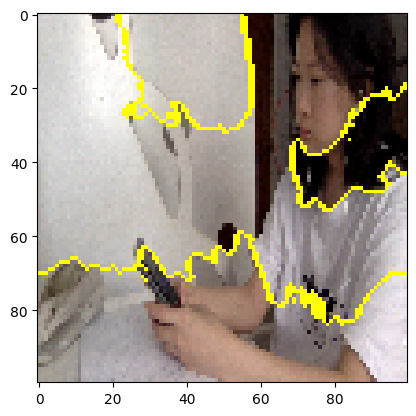

In [ ]:
idx = TP_indices[0][2] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 53ms/step


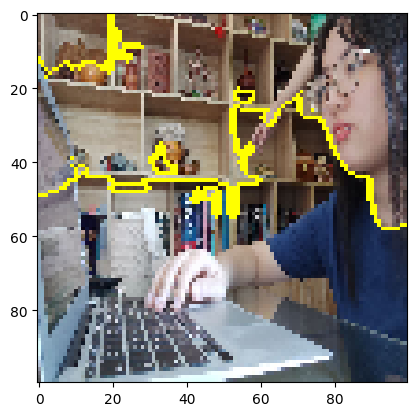

In [ ]:
idx = TP_indices[0][3] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


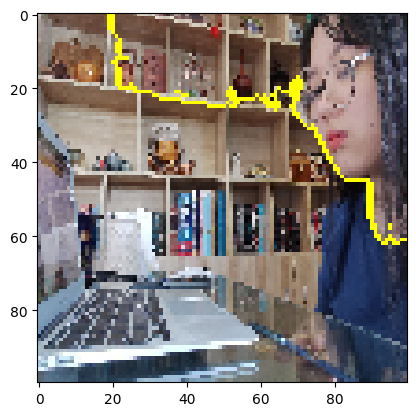

In [ ]:
idx = TP_indices[0][4] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


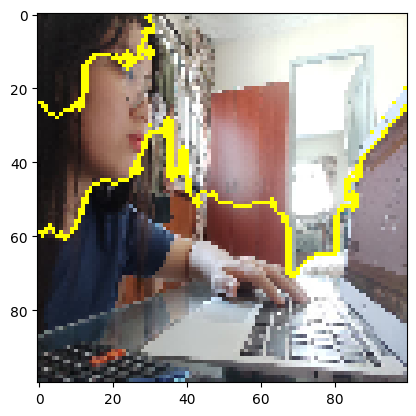

In [ ]:
idx = TP_indices[0][5] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


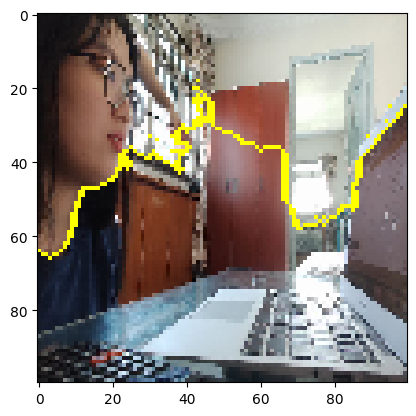

In [ ]:
idx = TP_indices[0][6] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


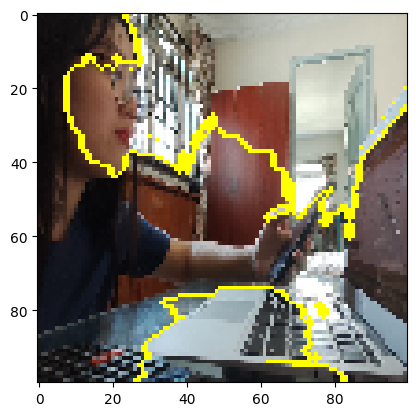

In [ ]:
idx = TP_indices[0][7] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


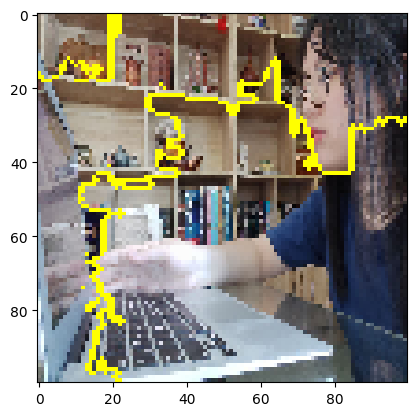

In [ ]:
idx = TP_indices[0][8] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


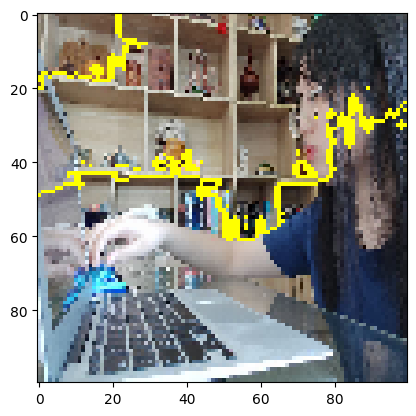

In [ ]:
idx = TP_indices[0][9] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


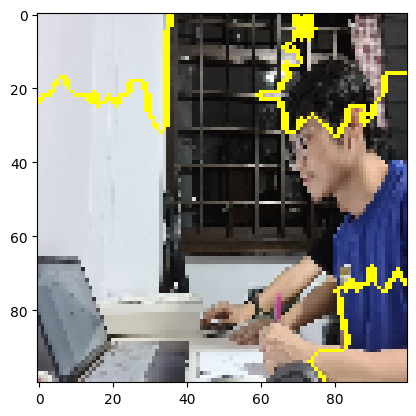

In [ ]:
idx = TP_indices[0][10] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


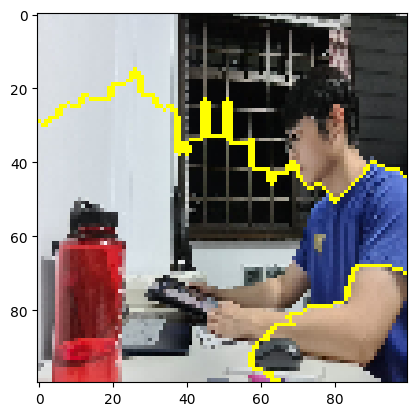

In [ ]:
idx = TP_indices[0][11] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


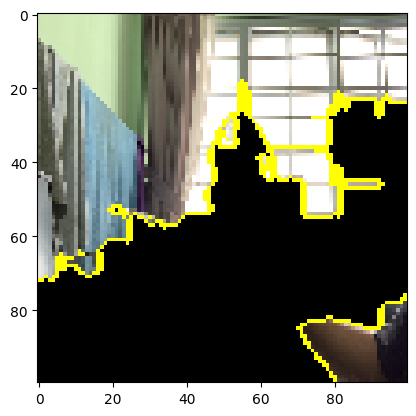

In [ ]:
idx = TP_indices[0][12] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=True
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


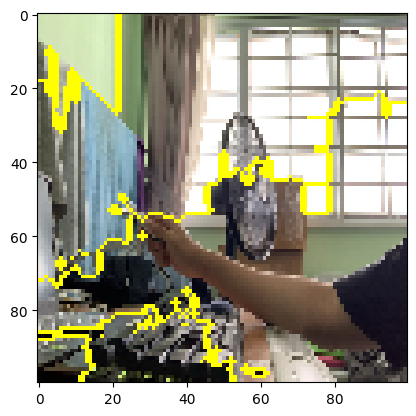

In [ ]:
idx = TP_indices[0][13] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


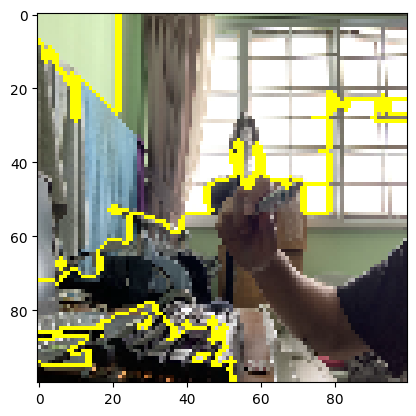

In [ ]:
idx = TP_indices[0][14] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


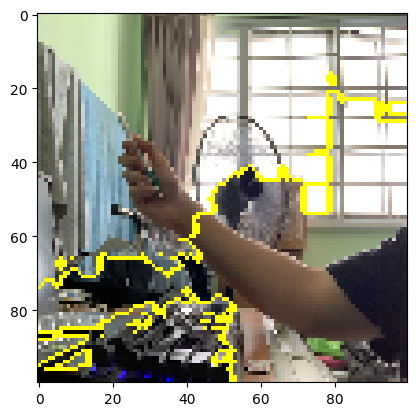

In [ ]:
idx = TP_indices[0][15] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


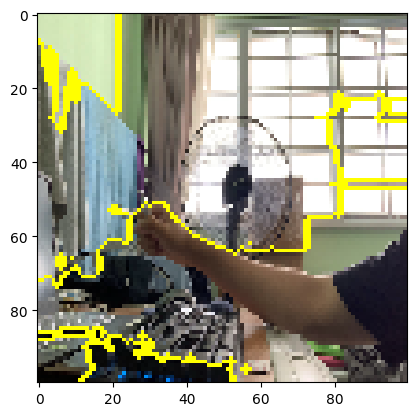

In [ ]:
idx = TP_indices[0][16] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


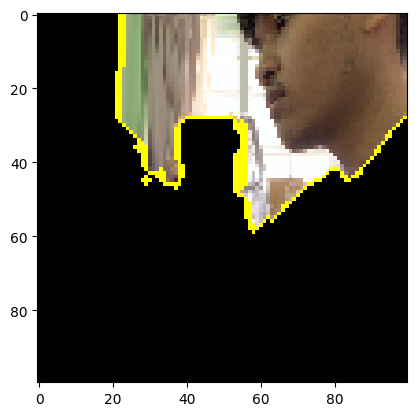

In [ ]:
idx = TP_indices[0][17] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=True
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


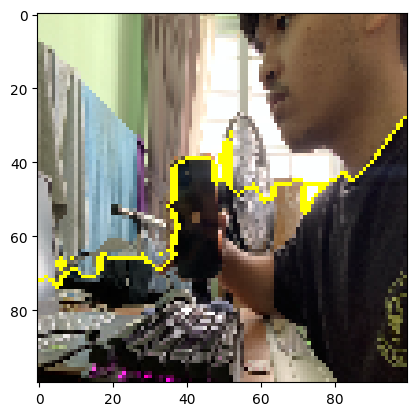

In [ ]:
idx = TP_indices[0][18] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


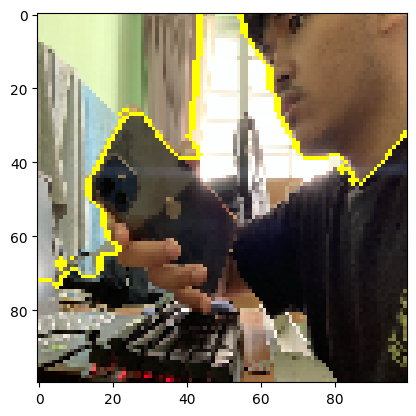

In [ ]:
idx = TP_indices[0][19] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


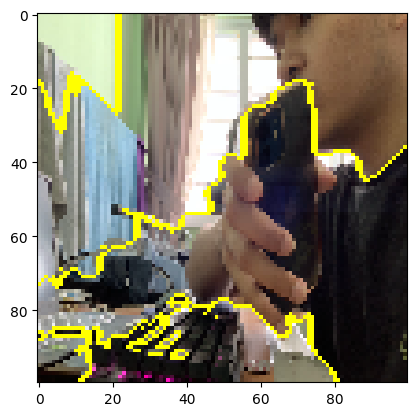

In [ ]:
idx = TP_indices[0][20] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


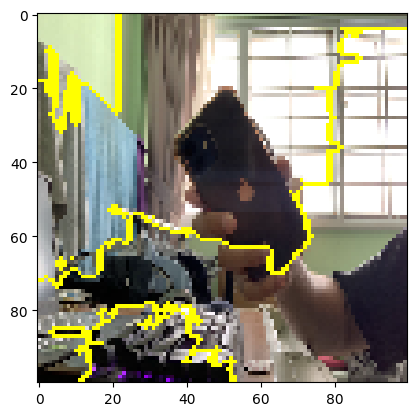

In [ ]:
idx = TP_indices[0][21] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


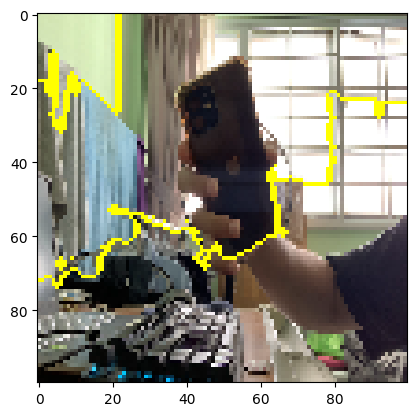

In [ ]:
idx = TP_indices[0][22] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


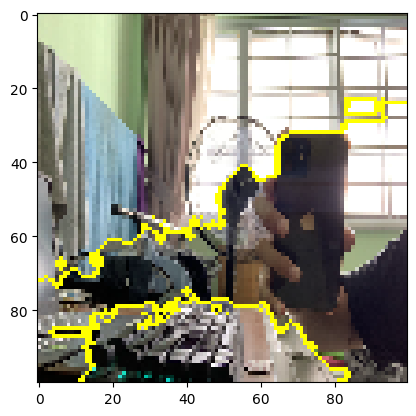

In [ ]:
idx = TP_indices[0][23] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


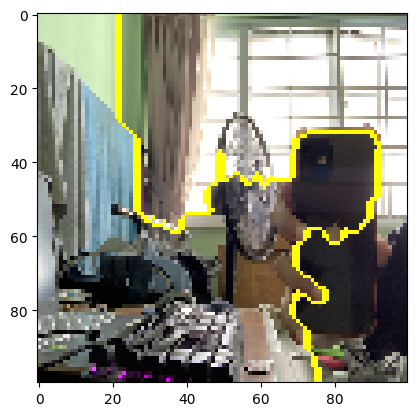

In [ ]:
idx = TP_indices[0][24] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


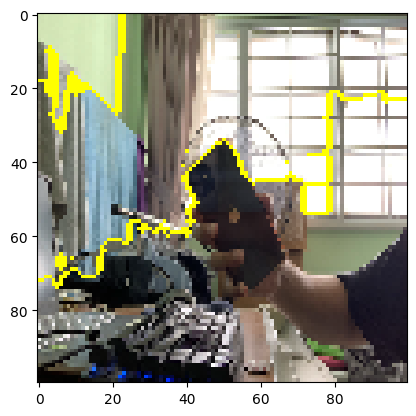

In [ ]:
idx = TP_indices[0][25] - 64
test_generator = data_augmentation_test(100, 100, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

## VGG19

In [ ]:
model_vgg19_train1 = load_model('/content/drive/MyDrive/IS4242 Project/models/model_vgg19_train1.hdf5')

In [ ]:
test_results(224, 224, 64, model_vgg19_train1)

Performance on Test Data
Found 150 images belonging to 2 classes.
3/3 [==============================] - 19s 2s/step
Confusion Matrix: 
 [[76  1]
 [ 0 73]]
TN: 76, FP: 1, FN: 0, TP: 73


Accuracy: 0.9933333333333333
Recall: 1.0
Precision: 0.9864864864864865
F1: 0.9931972789115647
MCC: 0.986749701634094
F1_macro: 0.9933306655995733
ROC_AUC: 0.9935064935064934






{'Accuracy': 0.9933333333333333,
 'Recall': 1.0,
 'Precision': 0.9864864864864865,
 'F1': 0.9931972789115647,
 'MCC': 0.986749701634094,
 'F1_macro': 0.9933306655995733,
 'ROC_AUC': 0.9935064935064934}

In [ ]:
img_rows, img_cols = 100, 100
batch_size = 64
epoch_num = 30

test_generator = data_augmentation_test(224, 224, 64)
predictions = model_vgg19_train1.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# train_generator, validation_generator = data_augmentation_train_val(img_rows, img_cols, batch_size)
# predictions = model_vgg19_train1.predict(train_generator, verbose = 1)
# y_pred = np.argmax(predictions, axis=1)
# y_true = train_generator.classes
# indices = np.where(y_true == y_pred)[0]

TN_indices = np.where((y_true == 0) & (y_pred == 0))
TP_indices = np.where((y_true == 1) & (y_pred == 1))

# print("Indices where elements are the same:", indices)
# print("Values at those indices in a:", y_pred[indices])
# print("Values at those indices in b:", y_true[indices])

Found 150 images belonging to 2 classes.
3/3 [==============================] - 9s 2s/step


### True Negatives

In [ ]:
TN_indices[0]

array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76])

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


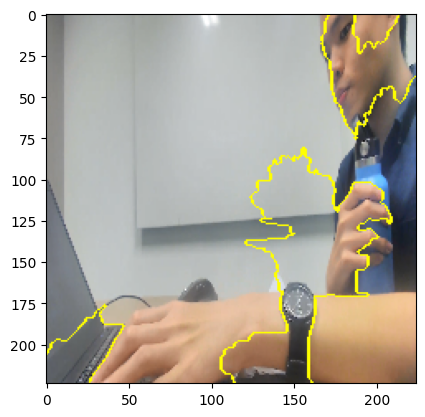

In [ ]:
idx = TN_indices[0][1]
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


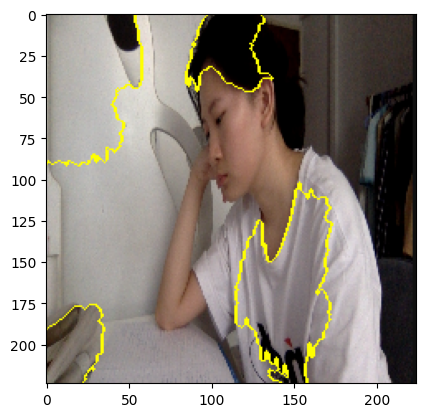

In [ ]:
idx = TN_indices[0][2]
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


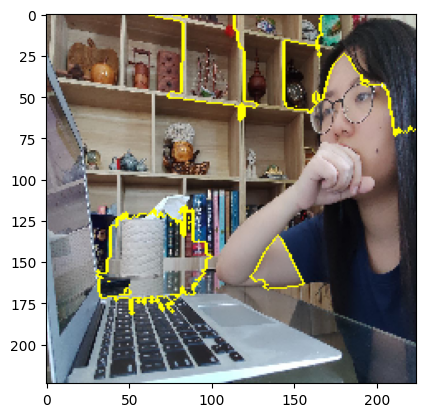

In [ ]:
idx = TN_indices[0][3]
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

### True Positives

In [ ]:
TP_indices

(array([ 77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
         90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
        103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
        116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
        129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
        142, 143, 144, 145, 146, 147, 148, 149]),)

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


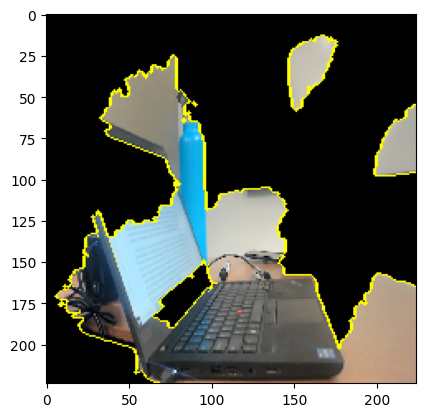

In [ ]:
idx = TP_indices[0][0] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=True
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


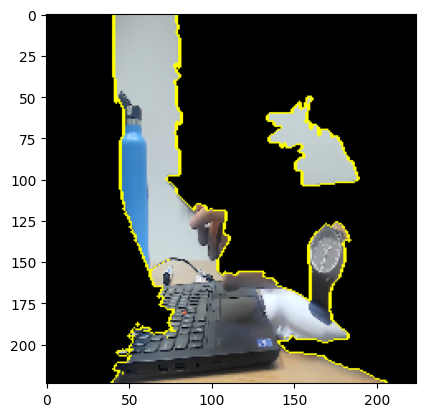

In [ ]:
idx = TP_indices[0][1] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=True
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


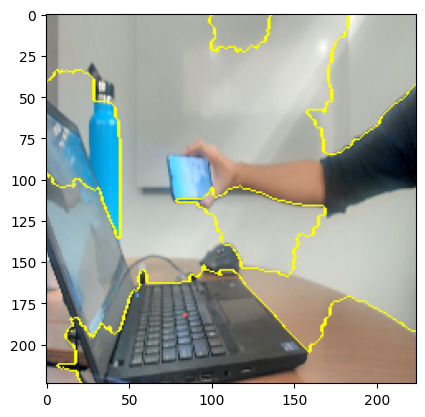

In [ ]:
idx = TP_indices[0][2] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


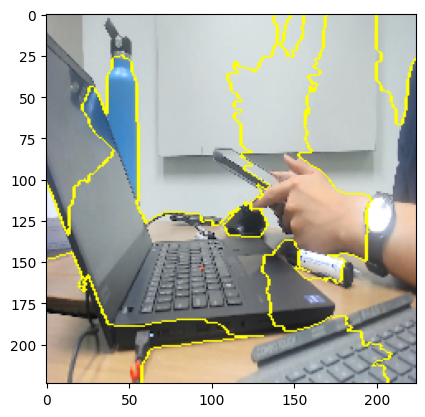

In [ ]:
idx = TP_indices[0][3] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=10,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


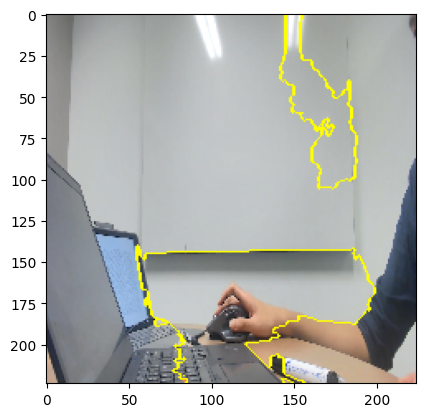

In [ ]:
idx = TP_indices[0][4] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 62ms/step


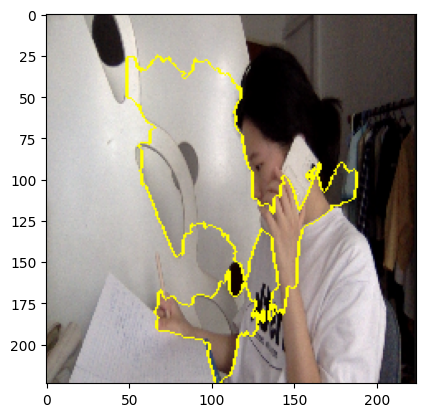

In [ ]:
idx = TP_indices[0][5] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


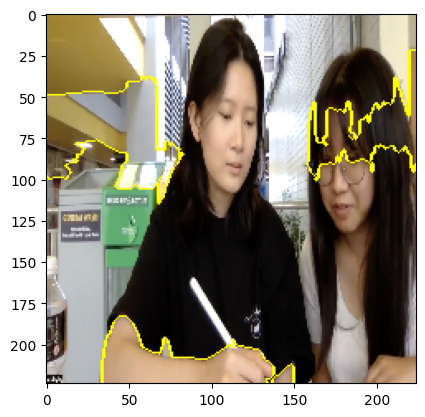

In [ ]:
idx = TP_indices[0][6] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


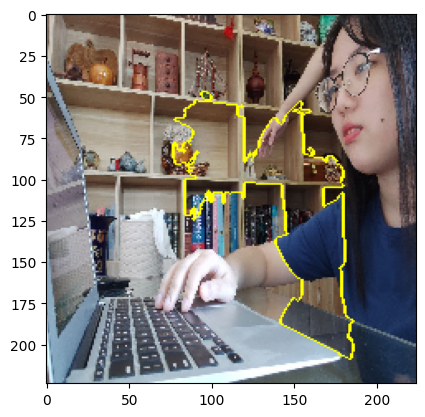

In [ ]:
idx = TP_indices[0][7] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


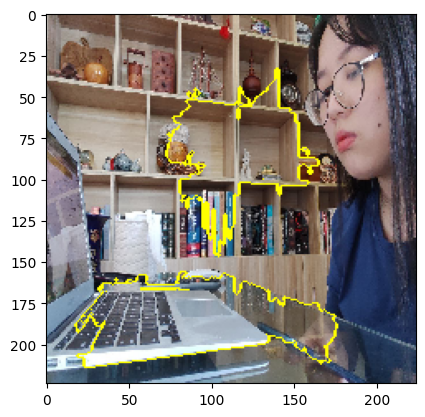

In [ ]:
idx = TP_indices[0][8] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


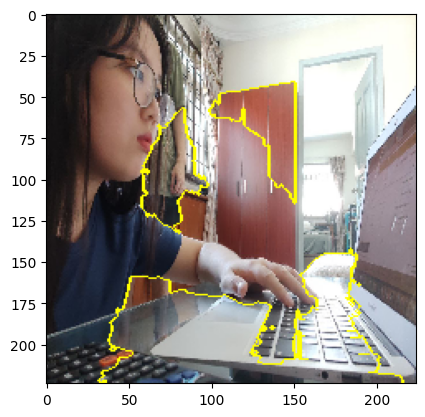

In [ ]:
idx = TP_indices[0][9] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


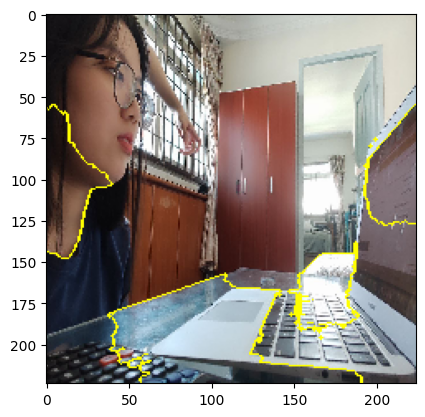

In [ ]:
idx = TP_indices[0][10] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


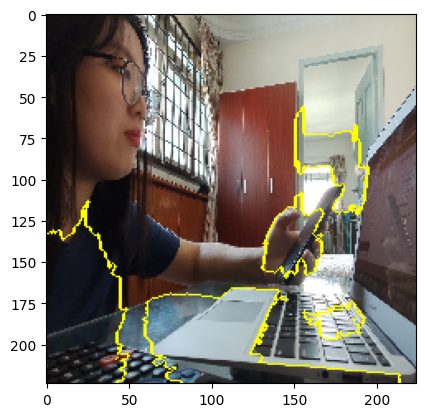

In [ ]:
idx = TP_indices[0][11] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


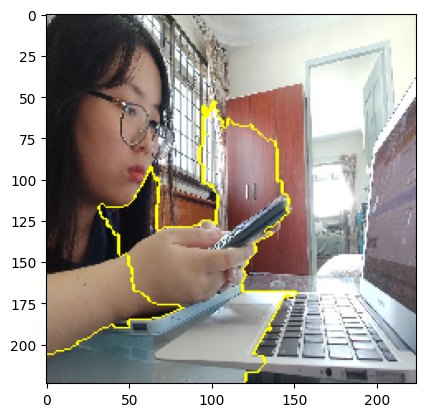

In [ ]:
idx = TP_indices[0][12] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


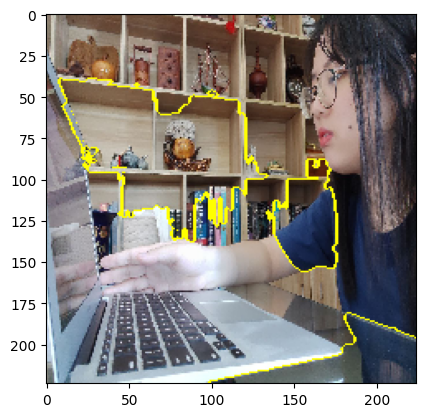

In [ ]:
idx = TP_indices[0][13] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))

Found 150 images belonging to 2 classes.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


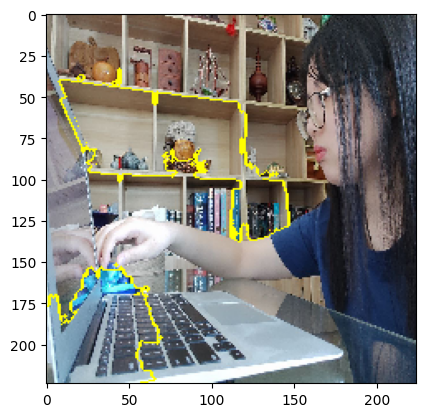

In [ ]:
idx = TP_indices[0][14] - 64
test_generator = data_augmentation_test(224, 224, 64)
img_tes = test_generator.next()
img_tes = test_generator.next()

def predict_fn(images):
    return model_vgg19_train1.predict(images)

explainer = lime_image.LimeImageExplainer(random_state=4242)
explanation = explainer.explain_instance(
         img_tes[idx].astype(float),
         predict_fn,
         top_labels=1,
         hide_color=0,
         num_samples=1000
)
image, mask = explanation.get_image_and_mask(
         explanation.top_labels[0],
         positive_only=True,
         num_features=5,
         hide_rest=False
)
plt.imshow(mark_boundaries(image, mask))